This notebook is part of an exploratory analysis of machine learning used to decompose hyperspectral datasets of hybrid perovskite nanoscale materials.

Two machine learning models are mainly used in this project: Nonnegative Matrix Factorization (NMF) and Variational Autoencoders (VAEs). This notebook implements semi-supervised VAE models to better represent the types of spectral features and their locations in the material.

**Notebook Four: Semi-Supervised VAE**

# Imports, Functions, and Classes

## Imports

In [1]:
from preprocessing import *
from vae_functions import *

import torch
from torchvision.utils import make_grid
import pyroved as pv
import pyro.distributions as dist
import pyro
from pyroved.models.base import baseVAE
from pyroved.nets import fcDecoderNet, fcEncoderNet, sDecoderNet
from pyroved.utils import (
    generate_grid, get_sampler, set_deterministic_mode, to_onehot, transform_coordinates)

SEM images: f1_img1, f2_img1
CL images: f1_img2, f2_img2
Denoised data: f1_sb_median, f2_sb_median
2D denoised data: f1_denoised_2d, f2_denoised_2d
Example points: f1_x_points, f1_y_points, f2_x_points, f2_y_points
Wavelengths and dimensions: f1_wav, f2_wav, f1_xpix, f1_ypix, f1_zpix, f2_xpix, f2_ypix, f2_zpix


# Unsupervised Variational Autoencoder

An autoencoder is an unsupervised neural network model that learns two functions: an encoding function (transforms input into latent space representation with lower dimensionality) and a decoding function (recreates input data from latent representation). The autoencoder attempts to optimize the representation of unbalanced/non-linear data (as opposed to PCA or NMF, which are linear). It is more deterministic in its approach than a VAE.

Hyperparameters: Code size, number of layers, number of nodes per layer, and the loss function

Architecture: Input, encoder, latent space, decoder, and output

A variational autoencoder is a generative, semi-supervised autoencoder with the addition of regularized training (which prevents overfitting). This crucial additional step allows for each point in the latent space to yield meaningful data, allowing for generative processes. These are more probabilistic in nature and enforce a (generally Gaussian) distribution in the sampling process. The end result is a latent space that is optimized for clustering together similar data points while giving a continuous distribution across the entire latent space. This is achieved through minimizing the KL divergence (causing the mean to approach 0 and the standard deviation to approach 1).

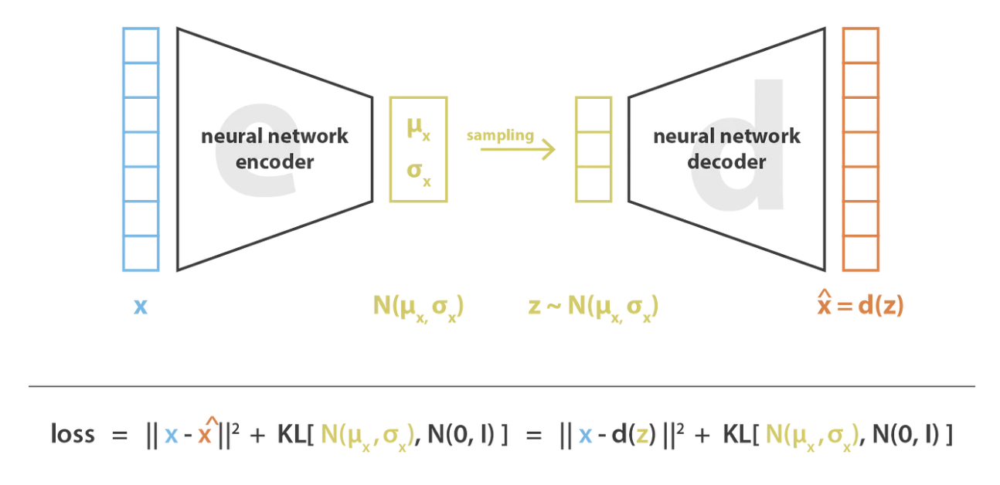

Loss function: reconstruction term (Gradient descent) (makes encoding and decoding efficient) + regularization term (Kullback-Leibler Divergence) (creates regular latent space)

VAEs use a "reparameterization trick" to allow for backpropagation, which is impossible through a stochastic node. The process of sampling from a distribution that is parameterized by the model is not differentiable, and this is a problem for gradient-based approaches. There must be a method of making the predictions separate from the stochastic sampling element.

It accomplishes this by treating random sampling as a noise term which is now independent and not parameterized by the model. A Gaussian can be scaled by a sample from the noise distribution multiplied by the standard deviation added to the mean. This allows for further differentiation through the model.

We are primarily interested in the latent space representation of the data as this reveals to us the correlations in the data that the model detects. However many latent dimensions we specify in the training will be the number of principal components we analyze and their correlations to one another.

Semi-supervised machine learning involves aspects of both supervised and unsupervisded machine learning. A small portion of the training data is labeled, and this is used to classify the majority of the data, which is unlabeled. The goal here is to label several spectral features within the data and asses how well the model is able to pick up on the locations of these features through training in order to predict their location in new data.

## Plot Code

**Found in vae_functions.py**

**vae_plot** builds a plot of the latent space dimensions with two or three latent dimensions and plots points corresponding to single pixels in the x and y axes of the original dataset. The point is to show a relationship between different spectral features detected by the autoencoder. Below the plot is an image component of the latent representation of the data.

**spectra_plot** plots each spectrum in the image color mapped according to its value along a specified axis.

**ssvae_plot** plots the latent space and image reconstruction of SSVAE models

**pointfinder_plot** shows every spectrum with a certain x value (along a vertical line in the image).

**spectsig_plot** shows all labeled spectra color mapped according to each class

**ssvae_label_plot** shows the first 180 spectra the SSVAE model assigns to a specified class

**spect_label_plot** plot one spectrum from each class in the labeled data

**custom_spect_label_plot** plot one spectrum from each class in the latent representation of the data

## Invariant VAE (2 latent dimensions)

Variational autoencoder that enforces rotational, translational, and scale invariances. The goal is to remove any effect these transformations will cause in the encoding process and to pick up on the similarities in the features.

### Grain 1

#### Code

First step: Transpose denoised array, reshape to 1D, normalize entire dataset, and reshape to 2D

Second step: Convert from Numpy array to PyTorch tensor, then find number of samples (spectra) and signal (number of points in image along x and y axes containing spectra)

(pv.utils.init_dataloader: Returns initialized PyTorch dataloader, which is used by pyroVED’s trainers. The inputs are torch Tensor objects containing training data and, optionally, labels.)

Third step: Create a dataloader object with unsqueezed training data. This is the entire hyperspectral array reshaped into 2 dimensions with another dimension of size one inserted into the array

(pyroved.trainers.SVItrainer: Stochastic variational inference (SVI) trainer for unsupervised and class-conditioned VED models consisting of one encoder and one decoder.)

Fourth step: An invariant VAE model with 2 latent dimensions is created along with an SVI trainer. Then, 50 epochs are run with every 10 epochs printing the training loss, showing the convergence to local minima.

Fifth step: pv.models.iVAE.encode returns the mean and standard deviation of the Z (latent) space, giving an array of image points (20008 for Figure 1), each containing an entire spectrum, plotted on an axis of specified latent dimensions (in this case, 2)

In [3]:
# Reshaping the 2D array to 1D. Imagine the 3D hyperspectral image, take the top left pixel's (from the perspective of the x-y plane)
# spectrum, add the spectrum of the pixel to the right to the end, and continue left to right, top to bottom, until the entire image is 1D.
f1_denoised_1d_transpose = f1_denoised_2d.transpose(1,0).reshape(f1_zpix*f1_ypix*f1_xpix)
# Normalize the entire 1D array, then reshape it to 2D, pixels by spectra, arranged left to right and top to bottom
f1_denoised_2d_norm = normalize(f1_denoised_1d_transpose).reshape(f1_xpix*f1_ypix, f1_zpix)
# Convert to Torch tensor object
f1_denoised_2d_norm_t = torch.from_numpy(np.array(f1_denoised_2d_norm).astype('float64')).float()
f1_n_samples = f1_denoised_2d_norm_t.size()[0] # number of spectral points
f1_l_signal = f1_denoised_2d_norm_t.size()[1] # number of spectra

f1_train_data = f1_denoised_2d_norm_t.clone()
f1_train_loader = pv.utils.init_dataloader(f1_train_data.unsqueeze(1), batch_size=64)

f1_in_dim = (f1_l_signal,)
# Gradually increase the weight of the KL Divergence term in the loss function with each epoch
f1_kl_scale = torch.linspace(start=.001, end=.01, steps=50)

# Training the model
f1_vae = pv.models.iVAE(f1_in_dim, latent_dim=2, invariances=None, sampler_d="gaussian")
f1_vae_trainer = pv.trainers.SVItrainer(f1_vae)

for e in range(50):
    sc = f1_kl_scale[e] if e < len(f1_kl_scale) else f1_kl_scale[-1]
    f1_vae_trainer.step(f1_train_loader, scale_factor=sc)
    if e//10 == e/10:
        f1_vae_trainer.print_statistics()
        
f1_vae_z_mean, f1_vae_z_sd = f1_vae.encode(f1_train_data)

f1_vae_z_mean = normalize(f1_vae_z_mean)
f1_vae_z_sd = normalize(f1_vae_z_sd)

Epoch: 1 Training loss: 157.6064
Epoch: 11 Training loss: 145.6802
Epoch: 21 Training loss: 145.6788
Epoch: 31 Training loss: 145.6842
Epoch: 41 Training loss: 145.6906


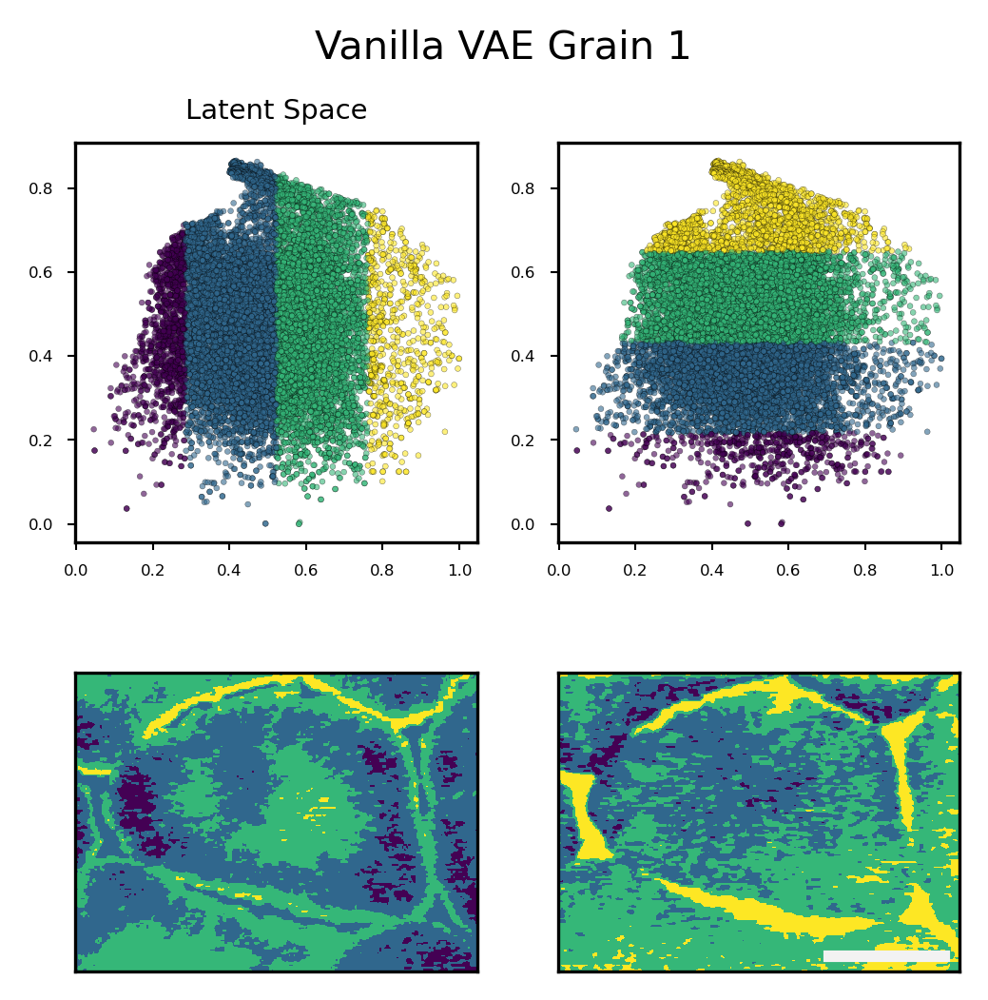

In [10]:
vae_plot("Vanilla VAE Grain 1", f1_vae_z_mean, f1_xpix, f1_ypix, 50)

### Grain 2

#### Code

In [5]:
f2_denoised_1d_transpose = f2_denoised_2d.transpose(1,0).reshape(f2_zpix*f2_ypix*f2_xpix)
f2_denoised_2d_norm = normalize(f2_denoised_1d_transpose).reshape(f2_ypix*f2_xpix, f2_zpix)
    
f2_denoised_2d_norm_t = torch.from_numpy(np.array(f2_denoised_2d_norm).astype('float64')).float()

f2_n_samples = f2_denoised_2d_norm_t.size()[0] # number of spectra
f2_l_signal = f2_denoised_2d_norm_t.size()[1] # number of spectral points

f2_train_data = f2_denoised_2d_norm_t.clone()
f2_train_loader = pv.utils.init_dataloader(f2_train_data.unsqueeze(1), batch_size=64)

f2_in_dim = (f2_l_signal,)
f2_kl_scale = torch.linspace(.001, .01, 50)

# Training the model
f2_vae = pv.models.iVAE(f2_in_dim, latent_dim=2, invariances=None, sampler_d="gaussian")
f2_vae_trainer = pv.trainers.SVItrainer(f2_vae)

for e in range(50):
    sc = f2_kl_scale[e] if e < len(f2_kl_scale) else f2_kl_scale[-1]
    f2_vae_trainer.step(f2_train_loader, scale_factor=sc)
    if e//10 == e/10:
        f2_vae_trainer.print_statistics()
        
f2_vae_z_mean, f2_vae_z_sd = f2_vae.encode(f2_denoised_2d_norm_t)

f2_vae_z_mean = normalize(f2_vae_z_mean)
f2_vae_z_sd = normalize(f2_vae_z_sd)

Epoch: 1 Training loss: 179.1582
Epoch: 11 Training loss: 145.7374
Epoch: 21 Training loss: 145.7132
Epoch: 31 Training loss: 145.7104
Epoch: 41 Training loss: 145.6995


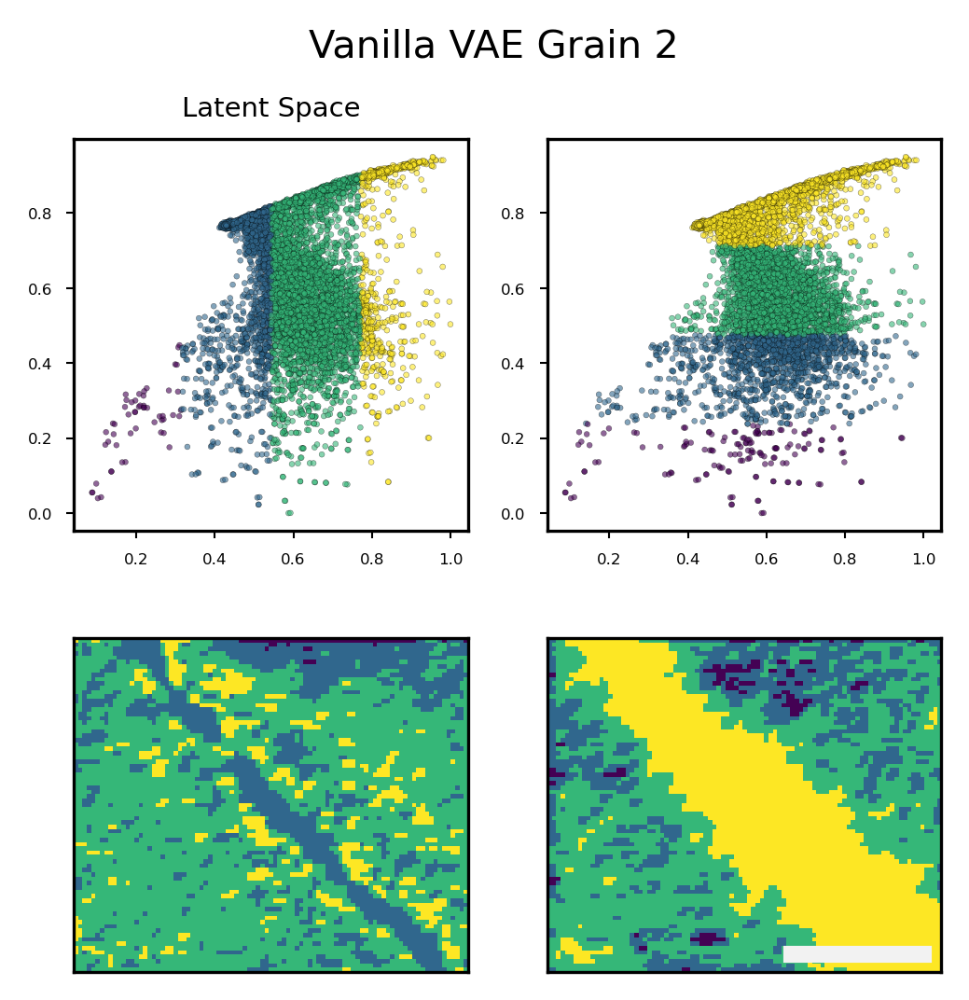

In [11]:
vae_plot("Vanilla VAE Grain 2", f2_vae_z_mean, f2_xpix, f2_ypix, 33.333333333)

# Semi-Supervised VAE on Grain 1

Semi-supervised machine learning involves aspects of both supervised and unsupervisded machine learning. A small portion of the training data is labeled, and this is used to classify the majority of the data, which is unlabeled. The goal here is to label several spectral features within the data and asses how well the model is able to pick up on the locations of these features through training in order to predict their location in new data.

## Preparing Data

### Plot spectral signature classes

First, manually determine 6 examples of each of the 4 features present in the material, giving a labeled set of 24 spectra

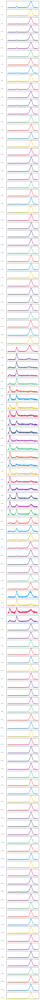

In [38]:
pointfinder_plot(f1_img2, 9, f1_ypix, f1_wav)

In [37]:
# arrays of points labeled 0 to 3, totalling 4 classes
f1_pts0 = [[50,50], [40,23], [40,21], [113,69], [93,75], [80,73], [4,4], [1,5], [55,100], [42,92]]
f1_pts1 = [[65,10], [67,17], [68,17], [69,17], [70,17], [74,17], [53,7], [52,7], [54,7], [74,9]]
f1_pts2 = [[22,142], [95,72], [96,72], [96,73], [95,71], [9,65], [47,8], [45,7], [43,7], [48,8]]
f1_pts3 = [[89,53], [9,67], [72,9], [7,69], [95,69], [7,72], [46,4], [42,4], [55,7], [42,8]]
f1_pts = [f1_pts0, f1_pts1, f1_pts2, f1_pts3]

# Reshape normalized 2D data to 3D
f1_denoised_3d_norm_t = f1_denoised_2d_norm_t.reshape(f1_ypix, f1_xpix, f1_zpix)
# Reshape denoided 2D data to 3D
f1_denoised_3d = np.reshape(f1_sb_median, (f1_zpix, f1_ypix, f1_xpix), order='C')

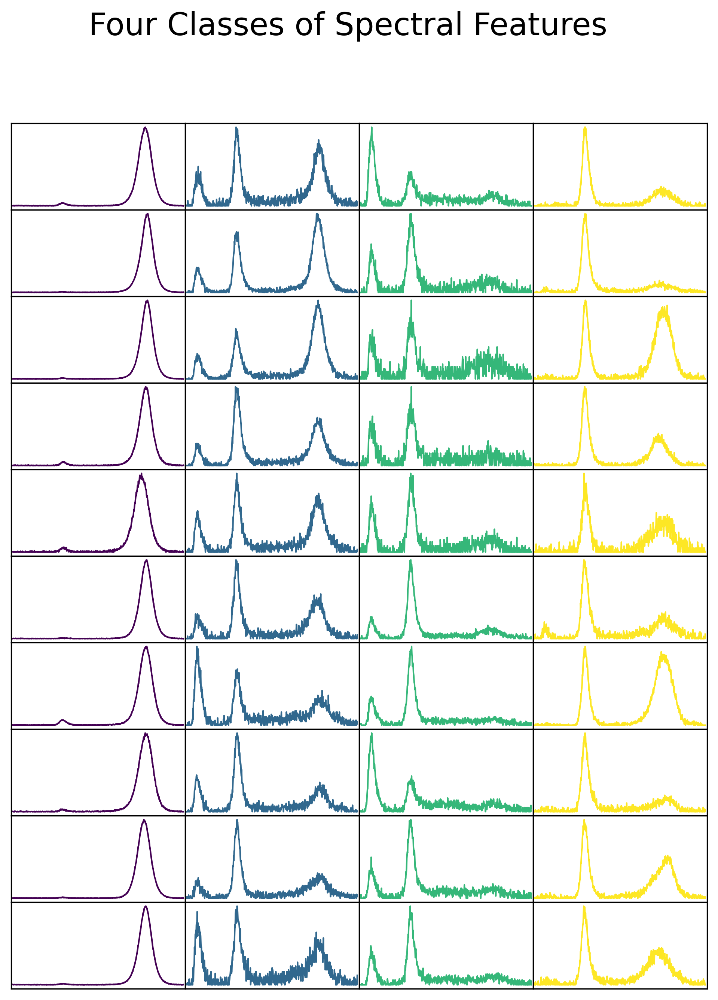

In [45]:
spectsig_plot("Four Classes of Spectral Features", f1_denoised_3d_norm_t, f1_pts, f1_wav)

### Modeling Data

X_sup: 16 labeled spectra for supervised training

y_sup: one-hot labels for the spectra (tensor of same size as X_sup)

X_val: 8 labeled spectra for validation step

y_val: labels for validation step

X_unsup: the rest of the spectra, with the above spectra replaced with zeros

In [47]:
# Create normalized, denoised, hyperspectral image
f1_denoised_3d_norm = normalize(f1_denoised_1d_transpose).reshape(f1_ypix, f1_xpix, f1_zpix)

# Labeled data
n_samples = len(f1_pts0)
n_sup = n_samples - 3 # number of supervised samples
n_val = 3 # number of validation samples
f1_X_sup = torch.stack((f1_denoised_3d_norm_t[f1_pts0[0][0],f1_pts0[0][1],:], 
                    f1_denoised_3d_norm_t[f1_pts0[1][0],f1_pts0[1][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[2][0],f1_pts0[2][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[3][0],f1_pts0[3][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[4][0],f1_pts0[4][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[5][0],f1_pts0[5][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[6][0],f1_pts0[6][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[0][0],f1_pts1[0][1],:], 
                    f1_denoised_3d_norm_t[f1_pts1[1][0],f1_pts1[1][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[2][0],f1_pts1[2][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[3][0],f1_pts1[3][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[4][0],f1_pts1[4][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[5][0],f1_pts1[5][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[6][0],f1_pts1[6][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[0][0],f1_pts2[0][1],:], 
                    f1_denoised_3d_norm_t[f1_pts2[1][0],f1_pts2[1][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[2][0],f1_pts2[2][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[3][0],f1_pts2[3][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[4][0],f1_pts2[4][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[5][0],f1_pts2[5][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[6][0],f1_pts2[6][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[0][0],f1_pts3[0][1],:], 
                    f1_denoised_3d_norm_t[f1_pts3[1][0],f1_pts3[1][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[2][0],f1_pts3[2][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[3][0],f1_pts3[3][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[4][0],f1_pts3[4][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[5][0],f1_pts3[5][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[6][0],f1_pts3[6][1],:])).float()

f1_sup_labels = torch.cat([torch.zeros(n_sup), torch.ones(n_sup),
                           2*torch.ones(n_sup), 3*torch.ones(n_sup)])
f1_y_sup = pv.utils.to_onehot(f1_sup_labels.long(), n=4) # create onehot array for supervised labels

f1_X_val = torch.stack((f1_denoised_3d_norm_t[f1_pts0[7][0],f1_pts0[7][1],:], 
                    f1_denoised_3d_norm_t[f1_pts0[8][0],f1_pts0[8][1],:],
                    f1_denoised_3d_norm_t[f1_pts0[9][0],f1_pts0[8][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[7][0],f1_pts1[7][1],:], 
                    f1_denoised_3d_norm_t[f1_pts1[8][0],f1_pts1[8][1],:],
                    f1_denoised_3d_norm_t[f1_pts1[9][0],f1_pts1[9][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[7][0],f1_pts2[7][1],:], 
                    f1_denoised_3d_norm_t[f1_pts2[8][0],f1_pts2[8][1],:],
                    f1_denoised_3d_norm_t[f1_pts2[9][0],f1_pts2[9][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[7][0],f1_pts3[7][1],:], 
                    f1_denoised_3d_norm_t[f1_pts3[8][0],f1_pts3[8][1],:],
                    f1_denoised_3d_norm_t[f1_pts3[9][0],f1_pts3[9][1],:])).float()

#f1_X_val = torch.cat(f1_X_val)
f1_val_labels = torch.cat([torch.zeros(n_val), torch.ones(n_val),
                           2*torch.ones(n_val), 3*torch.ones(n_val)])
f1_y_val = pv.utils.to_onehot(f1_val_labels.long(), n=4) # create onehot array for validation labels

# Remove all labeled samples from unlabeled data by setting them to zero
f1_X_unsup = f1_denoised_3d_norm_t
for i in range(n_samples):
    for j in range(4):
        f1_X_unsup[f1_pts[j][i][0], f1_pts[j][i][1], :] *= 0
        
f1_X_unsup = f1_X_unsup.reshape(f1_xpix*f1_ypix, f1_zpix)

# Randomly shuffle points in image
#f1_X_unsup = f1_X_unsup[torch.randperm(f1_X_unsup.size()[0])]

(f1_loader_unsup, f1_loader_sup,
 f1_loader_val) = pv.utils.init_ssvae_dataloaders(
     f1_X_unsup, (f1_X_sup, f1_y_sup), (f1_X_val, f1_y_val), batch_size=64)
r = (len(f1_X_sup) + len(f1_X_val)) / (len(f1_X_unsup))
print("Ratio of labeled data to unlabeled data: {}".format(r))

Ratio of labeled data to unlabeled data: 0.001999200319872051


In [48]:
# Train the SSVAE model

f1_ss_data_dim = (f1_X_unsup.shape[1],)
latent_dim = 2
num_classes = 4 

# Initialize model
#f1_ssvae = pv.models.ss_reg_iVAE(
#    f1_ss_data_dim, latent_dim, num_classes, invariances=None)
f1_ssvae = pv.models.ssiVAE(
    f1_ss_data_dim, latent_dim, num_classes, invariances=None)

# Initialize trainer
f1_ss_trainer = pv.trainers.auxSVItrainer(f1_ssvae, task='classification')

# Gradually increase KL weight from 1 to 2 in the first 30 epochs
f1_ss_kl_scale = torch.linspace(1, 2, 30)
# Train model for n epochs
for e in range(50):
    sc = f1_ss_kl_scale[e] if e < len(f1_ss_kl_scale) else f1_ss_kl_scale[-1]
    f1_ss_trainer.step(f1_loader_unsup, f1_loader_sup, f1_loader_val,
                 aux_loss_multiplier=50, scale_factor=sc, sampler_d='gaussian')
    f1_ss_trainer.print_statistics()
    # Plot learned latent manifolds every 10 epoch
    #if (e+1) % 10 == 0:
        #plot_manifolds(f1_ssvae)

Epoch: 1 Training loss: 82.3200, Test accuracy: 0.2500
Epoch: 2 Training loss: 56.0877, Test accuracy: 0.2500
Epoch: 3 Training loss: 54.5155, Test accuracy: 0.2500
Epoch: 4 Training loss: 54.0529, Test accuracy: 0.3333
Epoch: 5 Training loss: 53.9958, Test accuracy: 0.2500
Epoch: 6 Training loss: 53.9822, Test accuracy: 0.3333
Epoch: 7 Training loss: 53.9917, Test accuracy: 0.3333
Epoch: 8 Training loss: 54.0051, Test accuracy: 0.3333
Epoch: 9 Training loss: 54.0207, Test accuracy: 0.3333
Epoch: 10 Training loss: 54.0421, Test accuracy: 0.3333
Epoch: 11 Training loss: 54.0690, Test accuracy: 0.3333
Epoch: 12 Training loss: 54.0930, Test accuracy: 0.3333
Epoch: 13 Training loss: 54.1123, Test accuracy: 0.2500
Epoch: 14 Training loss: 54.1381, Test accuracy: 0.2500
Epoch: 15 Training loss: 54.1642, Test accuracy: 0.3333
Epoch: 16 Training loss: 54.1878, Test accuracy: 0.3333
Epoch: 17 Training loss: 54.2150, Test accuracy: 0.3333
Epoch: 18 Training loss: 54.2338, Test accuracy: 0.3333
E

In [49]:
#f1_ssvae.manifold2d(d=5, extent=[-5,5,-5,5])
#for i in range(2):
#    f1_ssvae.manifold_traversal(8, i, cmap='viridis')

f1_ssvae_z_mean, f1_ssvae_z_sd, f1_ssvae_z_labels = f1_ssvae.encode(f1_train_data)
f1_ssvae_z_mean = normalize(f1_ssvae_z_mean)
f1_ssvae_z_sd = normalize(f1_ssvae_z_sd)
f1_ssvae_z_labels_2d = f1_ssvae_z_labels.reshape(f1_ypix,f1_xpix)

### Labels

In [52]:
f1_ssvae_0_labels = (f1_ssvae_z_labels_2d == 0).nonzero(as_tuple=False)
f1_ssvae_1_labels = (f1_ssvae_z_labels_2d == 1).nonzero(as_tuple=False)
f1_ssvae_2_labels = (f1_ssvae_z_labels_2d == 2).nonzero(as_tuple=False)
f1_ssvae_3_labels = (f1_ssvae_z_labels_2d == 3).nonzero(as_tuple=False)

#### Label lists

In [ ]:
print( len(f1_ssvae_0_labels),
      len(f1_ssvae_1_labels),
      len(f1_ssvae_2_labels),
      len(f1_ssvae_3_labels),
     len(f1_ssvae_0_labels)+len(f1_ssvae_1_labels)+len(f1_ssvae_2_labels)+len(f1_ssvae_3_labels))

In [40]:
f1_ssvae_0_labels

tensor([[  1,  80],
        [  1,  81],
        [  1,  86],
        ...,
        [104,  55],
        [113,   4],
        [113,   5]])

In [41]:
f1_ssvae_1_labels

tensor([[  0,  26],
        [  0,  27],
        [  0,  28],
        ...,
        [121, 161],
        [121, 162],
        [121, 163]])

In [42]:
f1_ssvae_2_labels

tensor([[  0,   0],
        [  0,   1],
        [  0,   2],
        ...,
        [121, 134],
        [121, 146],
        [121, 147]])

In [43]:
f1_ssvae_3_labels

tensor([[  0,  94],
        [  0,  95],
        [  1,   6],
        ...,
        [121,  88],
        [121, 112],
        [121, 113]])

In [44]:
oh_no = 0
for i in f1_ssvae_0_labels:
    if i in f1_ssvae_1_labels:
        oh_no += 1
        
oh_no

5531

In [45]:
not_in = 0
what = []
for i in f1_ssvae_0_labels:
    if i in f1_ssvae_2_labels:
        not_in += 1
        what.append(i.tolist())
        
print(not_in, '\n')
print(what)

5531 

[[1, 80], [1, 81], [1, 86], [1, 87], [1, 95], [1, 96], [1, 97], [2, 29], [2, 30], [2, 31], [2, 32], [2, 44], [2, 46], [2, 47], [2, 48], [2, 49], [2, 51], [2, 58], [2, 59], [2, 60], [2, 61], [2, 62], [2, 63], [2, 68], [2, 69], [2, 73], [2, 74], [2, 75], [2, 76], [2, 77], [2, 78], [2, 79], [2, 80], [2, 81], [2, 82], [2, 83], [2, 95], [2, 96], [2, 97], [2, 98], [2, 99], [2, 100], [2, 101], [2, 102], [2, 103], [2, 104], [2, 154], [2, 155], [3, 29], [3, 30], [3, 31], [3, 32], [3, 33], [3, 34], [3, 35], [3, 36], [3, 37], [3, 38], [3, 39], [3, 40], [3, 43], [3, 44], [3, 45], [3, 46], [3, 47], [3, 48], [3, 52], [3, 53], [3, 54], [3, 55], [3, 56], [3, 57], [3, 58], [3, 59], [3, 60], [3, 61], [3, 62], [3, 63], [3, 64], [3, 65], [3, 66], [3, 67], [3, 68], [3, 69], [3, 70], [3, 71], [3, 72], [3, 73], [3, 74], [3, 75], [3, 76], [3, 77], [3, 78], [3, 98], [3, 99], [3, 100], [3, 101], [3, 102], [3, 103], [3, 104], [3, 111], [3, 112], [3, 113], [3, 114], [3, 115], [3, 150], [3, 151], [3, 152], 

In [46]:
#f1_ssvae_2_labels.tolist().index([ 101, 90])

In [47]:
#plt.scatter(f1_ssvae_3_labels[:,1], f1_ssvae_3_labels[:,0], s=1, cmap='Viridis')

#### Label plot

In [56]:
# this plot shows the first 180 spectra the SSVAE model assigns to a specified class
ssvae_label_plot(f1_img2, f1_ssvae_2_labels, f1_wav) # Spectra from class 3

## Plotting Results

### Plot code

### SSVAE Grain 1 Plot

The first image in the figure below is a plot of the latent space color mapped according to the four spectral feature classes defined above. The second image is the hybrid perovskite cell showing the spatial locations of the four classes.

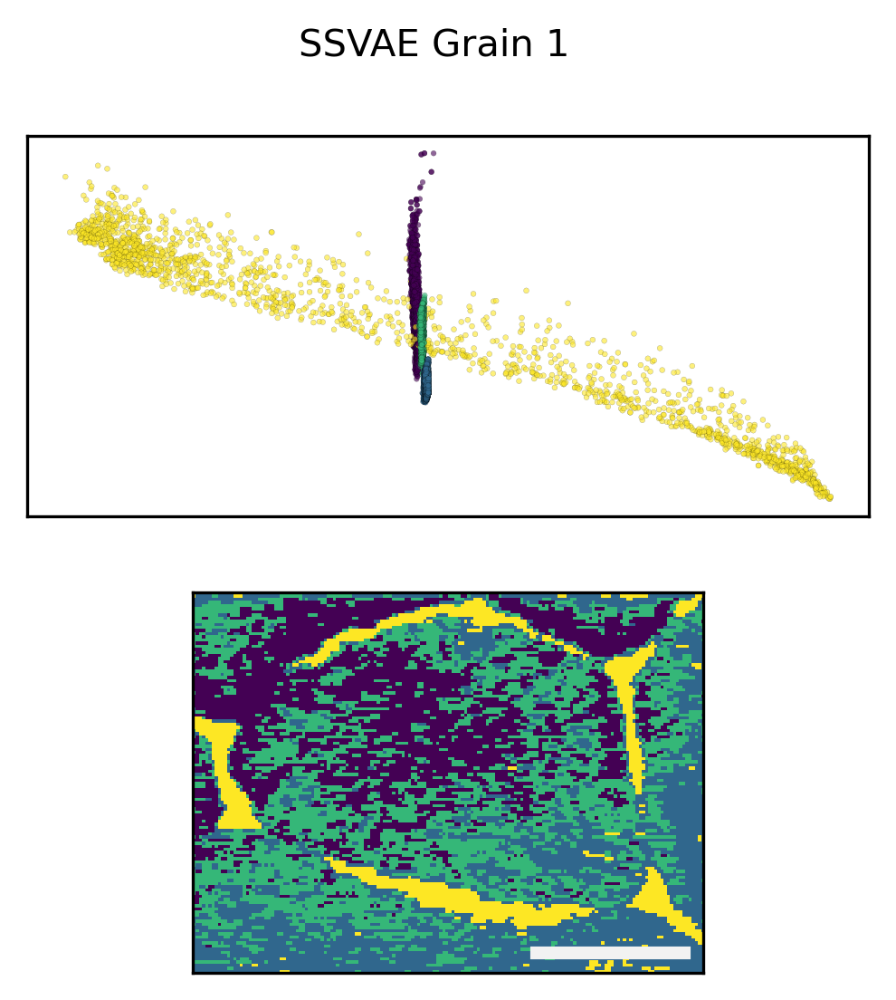

In [76]:
# SSVAE with 40 supervised data points
ssvae_plot("SSVAE Grain 1", f1_ssvae_z_mean, f1_ssvae_z_labels, f1_xpix, f1_ypix, 50)

### Spectral label plot

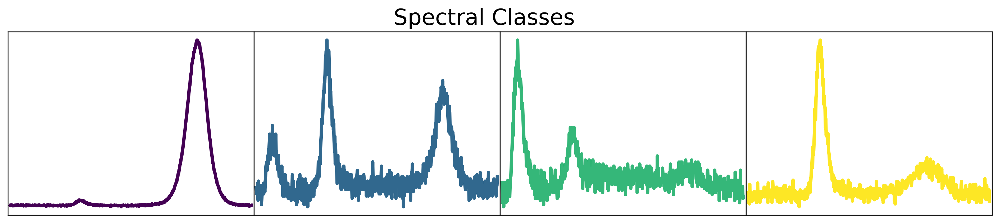

In [85]:
# Plot one spectrum from each class in the labeled data
spect_label_plot("Spectral Classes", f1_img2, f1_pts, f1_wav)

### Determining latent dimensions

X Min:  (array([13]), array([53]))
X Max:  (array([121]), array([146]))


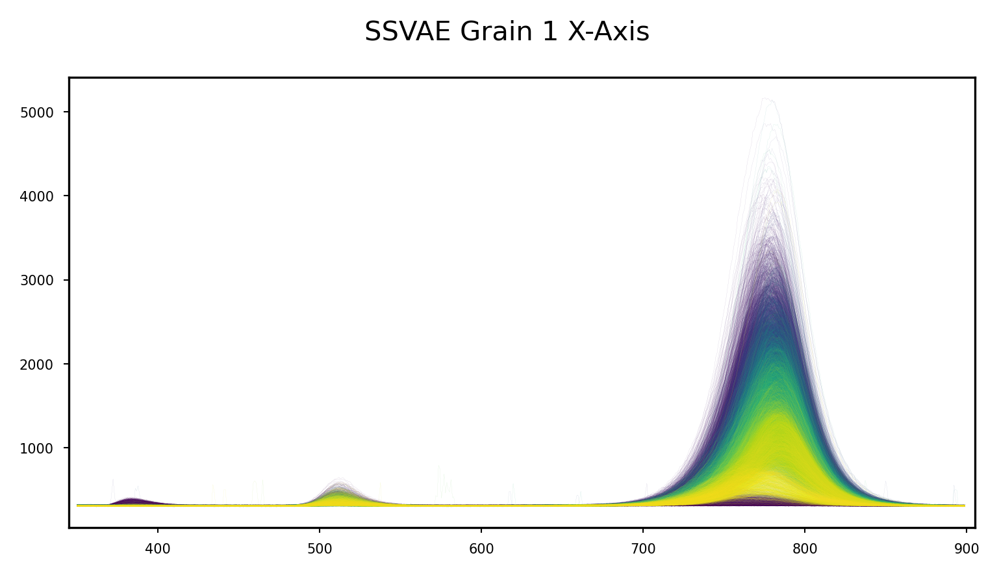

In [97]:
# X-axis
f1_ssvae_z_mean_x = f1_ssvae_z_mean[:,0].detach().cpu().numpy()
f1_ssvae_z_mean_x = f1_ssvae_z_mean_x.reshape(f1_ypix, f1_xpix)
print("X Min: ", (f1_ssvae_z_mean_x==np.min(f1_ssvae_z_mean_x)).nonzero())
print("X Max: ", (f1_ssvae_z_mean_x==np.max(f1_ssvae_z_mean_x)).nonzero())
f1_ssvae_z_mean_x_sort = np.dstack(
    np.unravel_index(np.argsort(f1_ssvae_z_mean_x.ravel()), (f1_ypix, f1_xpix)))
f1_ssvae_z_mean_x_sort = np.squeeze(f1_ssvae_z_mean_x_sort)

spectra_plot("SSVAE Grain 1 X-Axis", f1_img2, f1_ssvae_z_mean_x_sort, f1_xpix, f1_ypix, f1_wav)

Y Min:  (array([114]), array([137]))
Y Max:  (array([36]), array([18]))


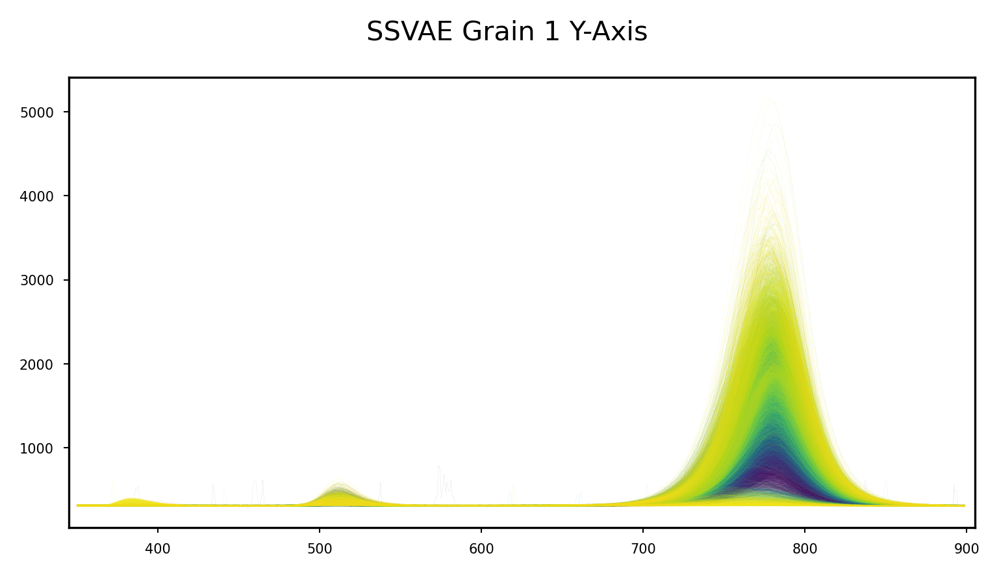

In [98]:
# Y-axis
f1_ssvae_z_mean_y = f1_ssvae_z_mean[:,1].detach().cpu().numpy()
f1_ssvae_z_mean_y = f1_ssvae_z_mean_y.reshape(f1_ypix, f1_xpix)
print("Y Min: ", (f1_ssvae_z_mean_y==np.min(f1_ssvae_z_mean_y)).nonzero())
print("Y Max: ", (f1_ssvae_z_mean_y==np.max(f1_ssvae_z_mean_y)).nonzero())
f1_ssvae_z_mean_y_sort = np.dstack(
    np.unravel_index(np.argsort(f1_ssvae_z_mean_y.ravel()), (f1_ypix, f1_xpix)))
f1_ssvae_z_mean_y_sort = np.squeeze(f1_ssvae_z_mean_y_sort)
spectra_plot("SSVAE Grain 1 Y-Axis", f1_img2, f1_ssvae_z_mean_y_sort, f1_xpix, f1_ypix, f1_wav)

### Grain 2 on SSVAE Model 1

In [99]:
f2on1_ssvae_z_mean, f2on1_ssvae_z_sd, f2on1_ssvae_z_labels = f1_ssvae.encode(f2_train_data)
f2on1_ssvae_z_mean = normalize(f2on1_ssvae_z_mean)
f1_ssvae_z_sd_6 = normalize(f1_ssvae_z_sd)

f2on1_ssvae_z_mean, f2on1_ssvae_z_sd, f2on1_ssvae_z_labels = f1_ssvae.encode(f2_train_data)
f2on1_ssvae_z_mean = normalize(f2on1_ssvae_z_mean)
f2on1_ssvae_z_sd = normalize(f2on1_ssvae_z_sd)

f2on1_ssvae_z_labels_2d = f2on1_ssvae_z_labels.reshape(f2_ypix,f2_xpix)
f2on1_ssvae_0_labels = (f2on1_ssvae_z_labels_2d == 0).nonzero(as_tuple=False)
f2on1_ssvae_1_labels = (f2on1_ssvae_z_labels_2d == 1).nonzero(as_tuple=False)
f2on1_ssvae_2_labels = (f2on1_ssvae_z_labels_2d == 2).nonzero(as_tuple=False)
f2on1_ssvae_3_labels = (f2on1_ssvae_z_labels_2d == 3).nonzero(as_tuple=False)

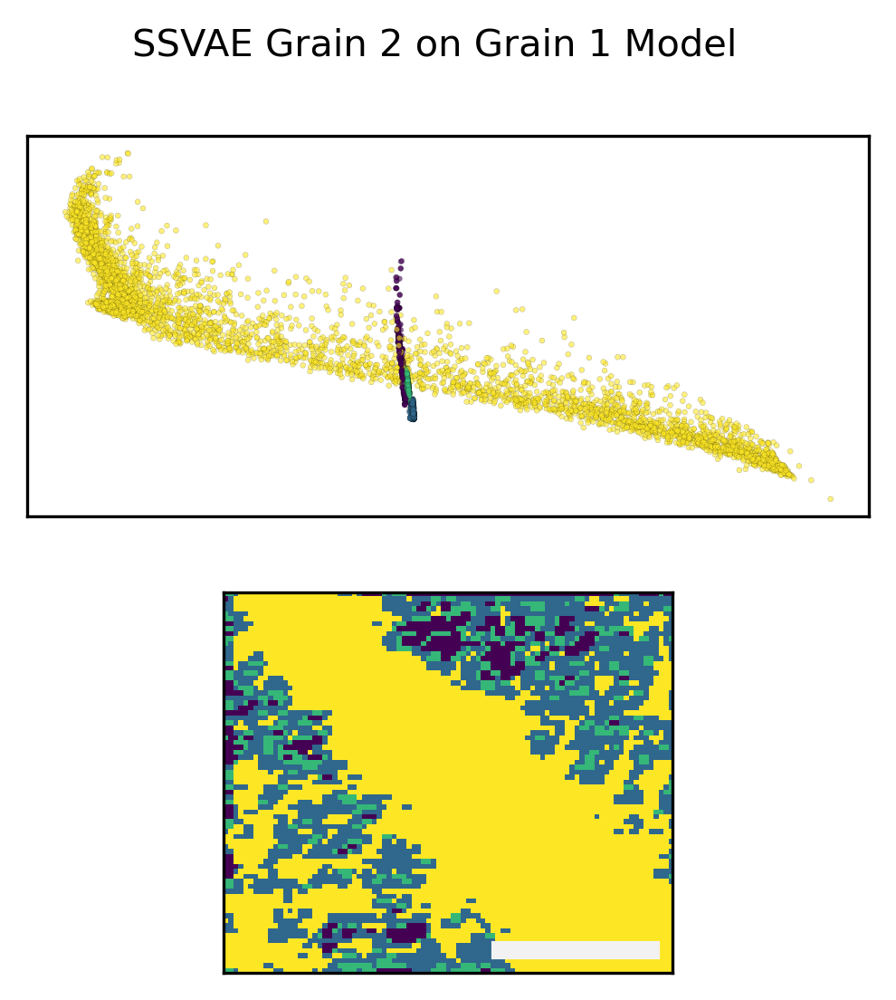

In [100]:
ssvae_plot("SSVAE Grain 2 on Grain 1 Model", f2on1_ssvae_z_mean, f2on1_ssvae_z_labels, 
           f2_xpix, f2_ypix, 33.333333333)

In [ ]:
ssvae_label_plot(f2_img2, f2on1_ssvae_2_labels, f2_wav, 180)

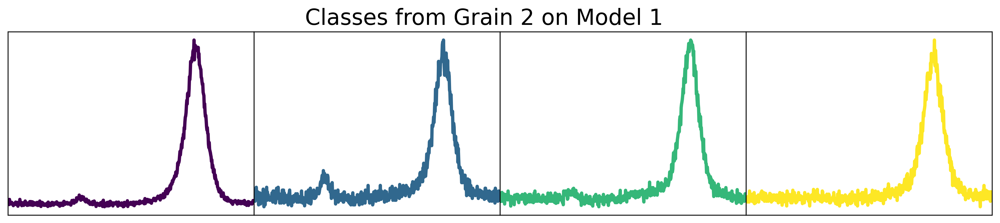

In [111]:
custom_spect_labels_2on1 = [f2on1_ssvae_0_labels[0], f2on1_ssvae_1_labels[128], 
                            f2on1_ssvae_2_labels[11], f2on1_ssvae_3_labels[161]]

# Plot one spectrum from each class in the latent representation of the data
custom_spect_label_plot("Classes from Grain 2 on Model 1", f2_img2, custom_spect_labels_2on1, f2_wav)

In [109]:
#f1_decode = f1_ssvae.decode(f1_ssvae_z_mean[0], f1_ssvae_z_labels)